<a href="https://colab.research.google.com/github/RudkovYaroslav/Moscow_catering_industry/blob/main/Moscow_catering_industry.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Проект: Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Цель исследования:

- Проанализировать рынок заведений 2022 года на возможность создания собственной сети
- Визуализировать предоставленную информацию
- С помощью графиков определиться с самыми важными показателями будущего бизнеса
- Сделать вывод о рентабельности создания бизнеса

Ход исследования

Я получу данные из датафрейма, который находится в csv файле. О качестве этого DataFrame пока ничего не известно, так что, скорее всего, понадобится провести предобработку.

Проверю данные на аномалии и выбросы, которые могут повлиять на исследование, заполню пропуски, если они имеются, и в целом поищу возможность исправить все ошибки, которые не приведут к искажению конечного результата.

Итоговое исследование пройдет в 5 этапов:

- Обзор данных
- Предобработка данных
- Анализ имеющихся данных
- Детализация исследования
- Общий вывод

## Обзор данных

### Импортируем нужные библиотеки и зададим некоторые стандартные параметры:

In [ ]:
import pandas as pd # Оснвная библиотека для работы с DataFrame
import re # Библиотека для более продвинутого посика в строках
import seaborn as sns # Библиотека для построения более продвинутых графиков
import matplotlib.pyplot as plt # Библиотека для построения базовых графиков и задачи им параметров
import statistics # Библиотека для использоования математических функций
import plotly.express as px # Один из компонентов сложных графиков plotly
import plotly.graph_objects as go # Один из компонентов сложных графиков plotly
import json # Библиотека для взаимодействия с json файлами
import folium # Библиотека для построения графиков, интегрированных с картами
from folium import Map, Choropleth, GeoJson, GeoJsonTooltip, Marker # Компоненты библиотеки follium
from folium.plugins import MarkerCluster # Компонент библиотеки follium
plt.rcParams["figure.figsize"] = (15,5) #Задаем изначальный размер для всех графиков
import numpy as np # Еще одна математическая библиотека python

Считаем файл:

In [ ]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [ ]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Видно, что есть пропуски в данных. По типам данных все в порядке. На дубликаты проверим в следующем этапе

## Предобработка данных

### Проверка на дубликаты

Сначала приведем названия заведений к одному регистру(нижнему), а затем проверим DataFrame на дубликаты:

In [ ]:
df['name'] = df['name'].str.lower()

In [ ]:
df.duplicated().sum()

0

Дубликаты не найдены

In [ ]:
df[['name', 'address']].duplicated().sum()

3

Нашли 3 дубликата неявных, проверим их

In [ ]:
df[df[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Скорее всего данные взяты из разных источников Оставим только те, которые выше, так как там больше информации

In [ ]:
df = df.drop_duplicates(subset=['name', 'address'])

Неявные также не обнаружены

In [ ]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Самый важный столбец - категория, не содержит пропусков/дубликатов

### Обработка пропусков

Все пропуски решено оставить, так как они находятся в не очень важных столбцах, а иногда и противоречат друг другу. Также мы никак не можем их заполнить, чтобы не повредить исследования. Самые важные для нас столбцы не содержат пустых значений.

In [ ]:
len(df['name'].unique())

5512

Из 8406 заведений у нас лишь 5512 уникальных названий, что говорит о том, что много сетевых в датафрейме, которые могут быть по разным адресам, но входить в часть одной сети

### Создание дополнительных столбцов

Необходимо создать столбец с названиями улиц. Для этого будем использовать библиотеку re. Напишем функцию:

In [ ]:
def extract_street(address):
    # Ищем оба варианта: "улица Х" и "Х улица"
    pattern = r'Москва,\s([^,]+)'
    match = re.search(pattern, address)

    if match:
        # Убираем лишние пробелы в начале и конце
        return match.group(1).strip()
    else:
        return None

И используем ее

In [ ]:
df['street'] = df['address'].apply(extract_street)

In [ ]:
df['street'].isna().sum()

0

Пропусков нет, значит алгоритм сработал правильно

In [ ]:
df['street'].value_counts()

проспект Мира                          183
Профсоюзная улица                      122
проспект Вернадского                   108
Ленинский проспект                     107
Ленинградский проспект                  95
                                      ... 
улица Зорге                              1
Лианозовский парк культуры и отдыха      1
Графский переулок                        1
Анненский проезд                         1
1-й Сетуньский проезд                    1
Name: street, Length: 1448, dtype: int64

Далее создадим столбец, в котором поместим 1, если заведение работает круглосуточно и 0, если нет

In [ ]:
df['is_24_7'] = df['hours'].apply(lambda x: True if x== 'ежедневно, круглосуточно' else False)

Посмотрим еще раз на датафрейм

In [ ]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Видно, что в столбце seats встречаются значения 0. Они сильно исказят наши вычисления, так что поставим вместо них пропуски

In [ ]:
df['seats'] = df['seats'].replace(0, None)

### Поиск аномалий и проверка на выбросы

#### rating

Рассмотрим столбцы, в которых у нас находятся числовые значения на аномалии и выбросы:

In [ ]:
display(f'Максимальное значение в столбце rating = {df["rating"].max()}')
display(f'Минимальное значение в столбце rating = {df["rating"].min()}')

'Максимальное значение в столбце rating = 5.0'

'Минимальное значение в столбце rating = 1.0'

В рейтинге все в порядке

#### middle_avg_bill

In [ ]:
display(f'Максимальное значение в столбце middle_avg_bill = {df["middle_avg_bill"].max()}')
display(f'Минимальное значение в столбце middle_avg_bill = {df["middle_avg_bill"].min()}')

'Максимальное значение в столбце middle_avg_bill = 35000.0'

'Минимальное значение в столбце middle_avg_bill = 0.0'

А вот здесь значения странные. Посмотрим глубже

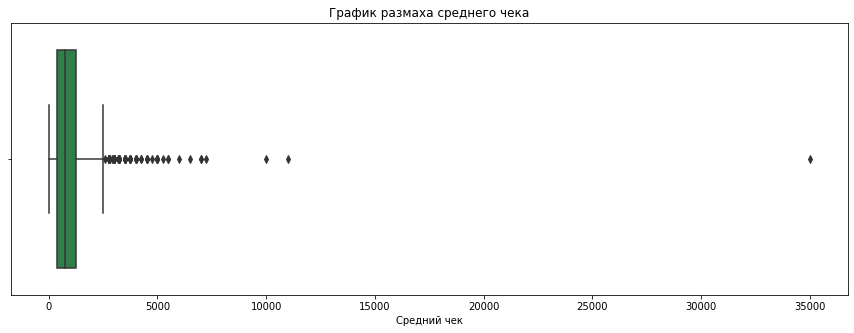

In [ ]:
sns.boxplot(x=df["middle_avg_bill"], color='#238b45')
plt.title('График размаха среднего чека')
plt.xlabel('Средний чек')
plt.show()

Видим некоторое количество аномалий. Заменим их на пропуски, чтобы не искажать расчеты. Будем руководствоваться 95-ым квантилем:

In [ ]:
df["middle_avg_bill"].quantile(0.95)

2250.0

In [ ]:
"{:.2%}".format(((df.loc[df['middle_avg_bill'] > df['middle_avg_bill'].quantile(0.95), \
                         'middle_avg_bill'].count() / df['middle_avg_bill'].count())))

'4.86%'

Имеем около 5% аномальных данных. Можем ими пожертвовать

In [ ]:
df.loc[df['middle_avg_bill'] > df['middle_avg_bill'].quantile(0.95), 'middle_avg_bill'] = None

Средний чек в районе 0, как показывает график размаха, не сильно повредит расчетам, да и тяжело будет понять, выше какого числа нам нужно ставить фильтр

#### middle_coffee_cup

In [ ]:
display(f'Максимальное значение в столбце middle_coffee_cup = {df["middle_coffee_cup"].max()}')
display(f'Минимальное значение в столбце middle_coffee_cup = {df["middle_coffee_cup"].min()}')

'Максимальное значение в столбце middle_coffee_cup = 1568.0'

'Минимальное значение в столбце middle_coffee_cup = 60.0'

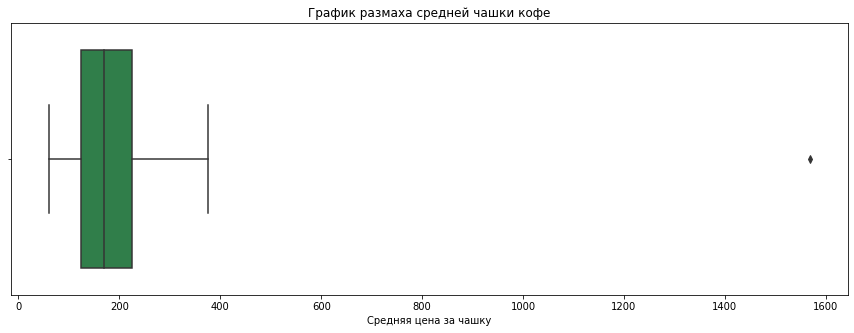

In [ ]:
sns.boxplot(x=df['middle_coffee_cup'], color='#238b45')
plt.title('График размаха средней чашки кофе')
plt.xlabel('Средняя цена за чашку')
plt.show()

У нас здесь лишь одно аномальное значение - изменим его на пропуск, как раньше

In [ ]:
df.loc[df['middle_coffee_cup'] == df['middle_coffee_cup'].max(), 'middle_coffee_cup'] = None

#### chain

In [ ]:
df['chain'].unique()

array([0, 1])

Здесь у нас все в порядке, только 0 и 1

#### seats

In [ ]:
display(f'Максимальное значение в столбце seats = {df["seats"].max()}')
display(f'Минимальное значение в столбце seats = {df["seats"].min()}')

'Максимальное значение в столбце seats = 1288.0'

'Минимальное значение в столбце seats = 1.0'

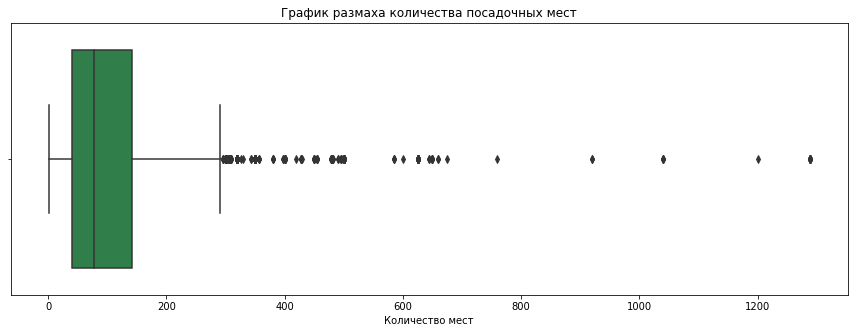

In [ ]:
sns.boxplot(x=df['seats'], color='#238b45')
plt.title('График размаха количества посадочных мест')
plt.xlabel('Количество мест')
plt.show()

Поступим также, как и раньше

In [ ]:
"{:.2%}".format(((df.loc[df['seats'] > df['seats'].quantile(0.95), 'seats'].count() / df['seats'].count())))

'4.33%'

Также имеем около 5% аномальных данных

In [ ]:
df.loc[df['seats'] > df['seats'].quantile(0.95), 'seats'] = None

### Вывод по разделу 2

Произвели предобработку данных:

- Проверили датафреймы на явные и неявные дубликаты. Их не оказалось
- Рассмотрели пропуски. По итогу их нигде не оказалось.
- Добавили новые столбцы и заполнили их данными
- Рассмотрели и избавились от аномальных данных(выбросов), которые могли повлиять на результаты расчетов

По итогу данные оказались очень хорошими и практически не нуждались в предобработке

## Анализ данных

### Анализ категорий заведений

Напомним, какие категории присутствуют в выборке:

In [ ]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Покажем графически

In [ ]:
category_df = df.groupby('category', as_index=False).agg(count=('name', 'count')).sort_values('count')

Перед постройкой первого графика создадим словарь цветов, чтобы все время была одна и та же палитра у каждого последующего графика:

In [ ]:
category_colors = {
    'кафе': '#3498DB',            # яркий синий
    'ресторан': '#D35400',        # глубокий оранжевый
    'кофейня': '#16A085',         # темно-бирюзовый
    'пиццерия': '#E74C3C',        # сбалансированный красный
    'бар,паб': '#9B59B6',        # нежный фиолетовый
    'быстрое питание': '#F39C12', # теплый желто-оранжевый
    'булочная': '#F1C40F',        # яркий желто-золотой
    'столовая': '#11b422'         # насыщенный зеленый
}


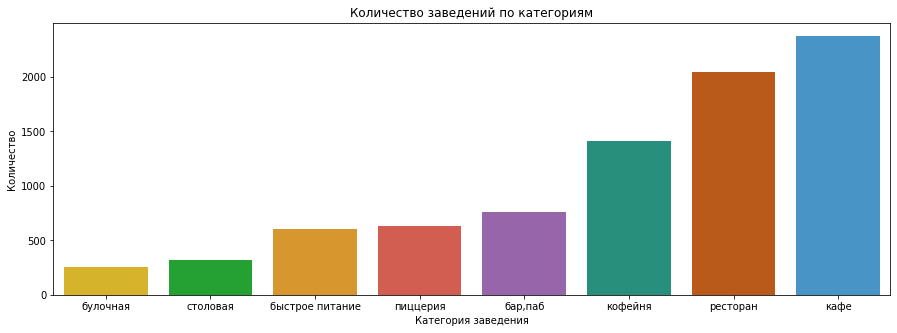

In [ ]:
sns.barplot(x='category', y='count', data=category_df, palette=category_colors)
plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.show()

Количество кафе в датафрейме лидирует, что, неудивительно. Данные заведения находятся на стыке простоты/дохода для компаний. Что интересно, так это количество ресторанов. Обычно рестораны позиционируют себя, как еда для более богатого класса и такое большое их количество удивительно.

### Анализ посадочных мест

Данный столбец оказался подверженным влиянию выбросов, а также пропусков, но мы разборались с этим на этапе предобработки

In [ ]:
seats_df = df.groupby('category', as_index=False).agg(median=('seats', 'median')).sort_values('median')

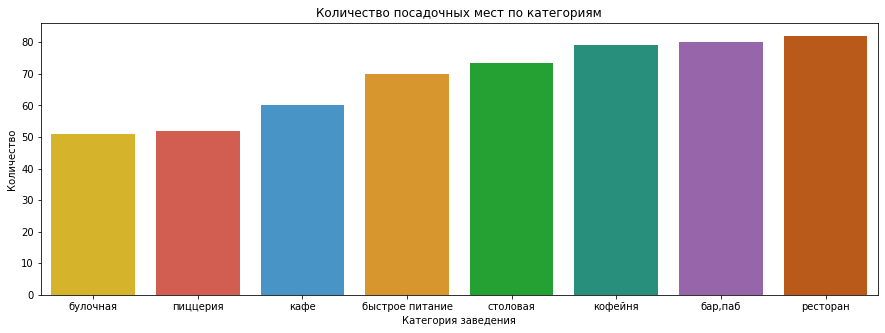

In [ ]:
sns.barplot(x='category', y='median', data=seats_df, palette=category_colors)
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.show()

Видим, что лидерами среди среднего количества посадочных мест являются бары и рестораны, что, в целом, не удивительно.

### Отношение сетевых и несетевых заведений

In [ ]:
chain_df = df.groupby('chain', as_index=False).agg(count = ('name', 'count'))

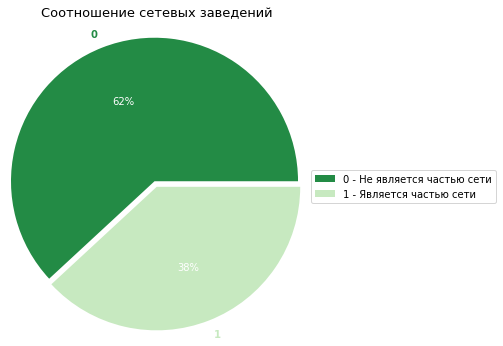

In [ ]:
fig, ax = plt.subplots()
patches, texts, pcts = ax.pie('count',
                              labels='chain',
                              data=chain_df, autopct='%1.f%%',
                              explode = (0.05, 0),
                              radius = 1.2,
                              colors=['#238b45', '#c7e9c0'])
ax.legend(['0 - Не является частью сети', '1 - Является частью сети'], loc='center left', bbox_to_anchor=(1, 0.5))
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())
fig.set_size_inches(10.5, 5.5)
plt.setp(pcts, color='white')
plt.setp(texts, fontweight=600)
plt.title('Соотношение сетевых заведений', size=13, y=1.05)
plt.show()

Графически вывели соотношение сетевых и несетевых заведений. Наглядно видно, что большинство заведений не принадлежат ни к какой сети, но, все равно, соотношение не так далеко от равного.

### Отношение сетевых и несетевых заведений по категориям

Рассмотрим доли сетевых заведений в каждой конкретной категории:

In [ ]:
category_chain_df = df.groupby('category', as_index=False).agg(chain_count = ('chain', 'sum'), count = ('chain', 'count'))

In [ ]:
category_chain_df['ratio'] = category_chain_df['chain_count'] / category_chain_df['count']

In [ ]:
category_chain_df = category_chain_df.sort_values('ratio')

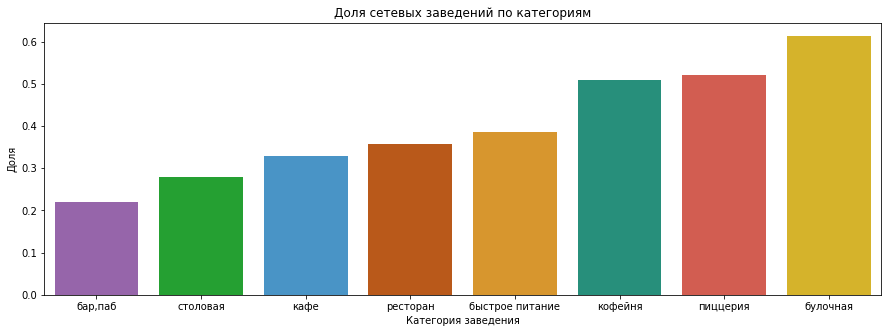

In [ ]:
sns.barplot(x=category_chain_df['category'], y=category_chain_df['ratio'], palette = category_colors)
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Доля')
plt.show()

На графике видно, что около 60% булочных входят в состав какой-либо сети, а бары почти в 80% случаев выступают сами по себе.

Самыми "сетевыми" заведениями оказались: булочные, пиццерии, кофейни

### Топ-15 популярных заведений

In [ ]:
top_15 = df[df['name'] != df['category']].groupby(['name', 'category'], as_index=False).\
        agg(count = ('chain', 'count')).sort_values('count', ascending=False).head(15)

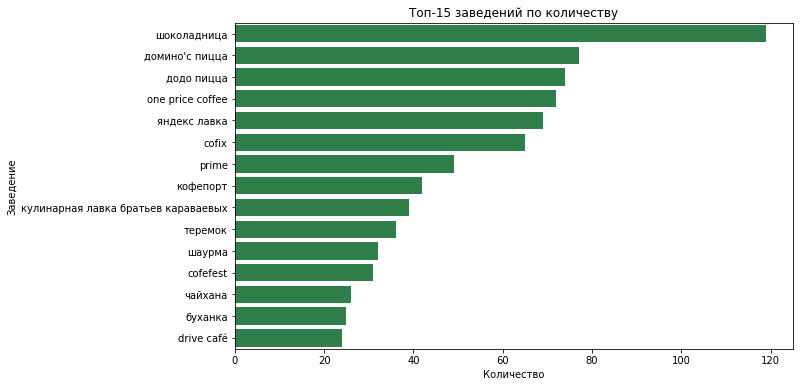

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='count', y='name', data=top_15, color='#238b45')
plt.title('Топ-15 заведений по количеству')
plt.xlabel('Количество')
plt.ylabel('Заведение')
plt.show()

На графике можем увидеть все 15 самых популярных заведений и количество зданий в сети. В результате присутствует действительно много известных названий, даже для меня(Шоколадница, Додо, Кофепорт, Теремок, Coffix)

In [ ]:
chain_ratio = df[df['name'].isin(top_15['name'])]['chain'].value_counts()

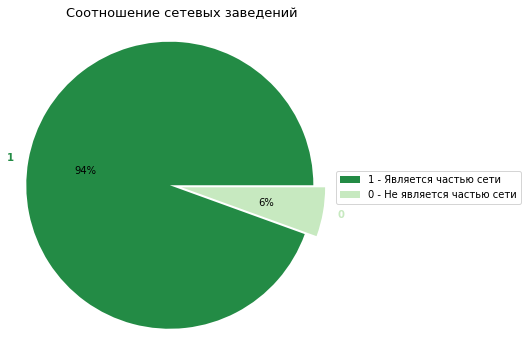

In [ ]:
fig, ax = plt.subplots()
patches, texts, pcts = ax.pie(chain_ratio.values,
                              labels=chain_ratio.index,
                              autopct='%1.f%%',
                              explode = (0.1, 0),
                              radius = 1.2,
                              colors=['#238b45', '#c7e9c0'])
ax.legend(['1 - Является частью сети', '0 - Не является частью сети'], loc='center left', bbox_to_anchor=(1, 0.5))
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())
fig.set_size_inches(10.5, 5.5)
plt.setp(pcts, color='black')
plt.setp(texts, fontweight=600)
plt.title('Соотношение сетевых заведений', size=13, y=1.05)
plt.show()

Как можем увидеть, объединяет самые популярные заведения по большей части то, что они являются частью сети(франшизы)

Посмотрим к каким категориям принадлежат самые популярные заведения:

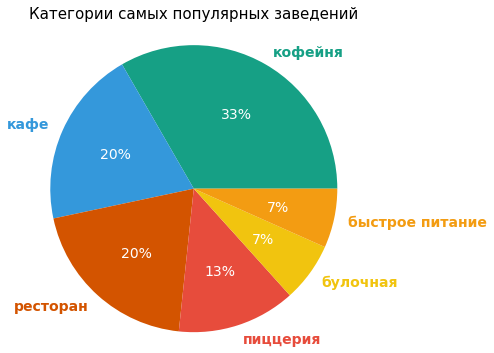

In [ ]:
top_15_category = top_15.groupby('category', as_index=False).agg(count = ('count', 'count')).sort_values('count', ascending=False)
fig, ax = plt.subplots()
patches, texts, pcts = ax.pie('count',
       labels='category', textprops={'fontsize': 14},
       data=top_15_category, autopct='%1.0f%%',
       radius = 1.2, colors=[category_colors[cat] for cat in top_15_category['category']])
fig.set_size_inches(10.5, 5.5)
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='white')
plt.setp(texts, fontweight=600)
plt.title('Категории самых популярных заведений', y=1.05, size=15)
plt.show()

По графику видно, что большинство популярных заведений являются либо кофейнями, либо кафе, либо ресторанами. Все как и на основной выборке. Ресторанов быстрого питания и блучоных практически нет в выборке.

### Количество заведений по администраивным районам

Построим единый график с использованием библиотеки plotly, на котором покажем, как разбиты категории заведений по всем районам, и по каждому в отдельности:

In [ ]:
count_by_category_district = df.groupby(['district', 'category']).size().reset_index(name='building_count')

# Сортируем районы по общему количеству заведений
total_counts = count_by_category_district.groupby('district')['building_count'].sum().reset_index()

# Сортируем по убыванию общего количества заведений
sorted_districts = total_counts.sort_values(by='building_count', ascending=False)['district']

# Применяем сортировку к исходным данным и сохраняем порядок
count_by_category_district = count_by_category_district.set_index('district')
count_by_category_district = count_by_category_district.loc[sorted_districts].reset_index()

# Получаем уникальные районы и категории для фильтрации
districts = count_by_category_district['district'].unique()
categories = count_by_category_district['category'].unique()

# Создаем пустую фигуру
fig = go.Figure()

for category in categories:
    filtered_data = count_by_category_district[count_by_category_district['category'] == category]

    # Сгруппируем данные по районам
    districts_in_category = filtered_data.sort_values('building_count')['district']
    counts_in_category = filtered_data.sort_values('building_count')['building_count']

    fig.add_trace(go.Bar(
        x=counts_in_category,  # Количество заведений по каждой категории
        y=districts_in_category,  # Районы
        name=category,  # Имя категории
        orientation='h',  # Горизонтальный бар-чарт
        marker_color=category_colors[category],  # Используем цвет категории
        visible=True# По умолчанию видимый
    ))

# Создаем список кнопок для фильтрации по категориям
dropdown_buttons = [
    dict(label="Все округа", method="update",
         args=[{"visible": [True] * len(districts) * len(categories)},  # Показываем все категории
               {"title": "Анализ количества заведений по округам"}])
]

# Добавляем кнопку для каждой категории
for i, category in enumerate(categories):
    button = dict(label=category, method="update",
                  args=[{"visible": [(i == j) for j in range(len(categories))]},  # Показываем только выбранную категорию
                        {"title": f"Количество заведений категории {category} в округах"}])
    dropdown_buttons.append(button)

# Настройка макета с легендой и фильтрацией
fig.update_layout(
    updatemenus=[dict(buttons=dropdown_buttons,
                      direction="down",
                      showactive=True,
                      x=0.17,
                      y=1.12,
                      xanchor='left',
                      yanchor='top',
                      pad={"r": 10, "t": 10},
                      font=dict(size=15))],
    xaxis_title='Количество заведений',
    yaxis_title='Наименование административного округа',
    title="Анализ количества заведений по округам",
    legend=dict(
        x=1,  # Легенда справа
        y=1,  # Легенда вверху
        traceorder="normal",
        font=dict(size=10),
        bgcolor="rgba(255, 255, 255, 0.5)",
        bordercolor="Black",
        borderwidth=1
    ),
    barmode='stack',  # Используем стековые бары
    width=1000,
    height=600
)

fig.update_xaxes(categoryorder='total ascending')
# Отображаем график
fig.show()


На графике можно увидеть доминирование центрального округа в количестве "городских" заведений, то есть рестораны, кофейни, кафе.

Также можно отметить малые количества булочных, столовых и ресторанов быстрого питания

Почти в каждом административном округе лидером по количеству заведений является кафе

In [ ]:
# Создаем пустую фигуру
fig = go.Figure()

# Собираем все данные в один DataFrame
combined_data = []

for category in categories:
    filtered_data = count_by_category_district[count_by_category_district['category'] == category]
    combined_data.append(filtered_data)

# Объединяем все данные в один DataFrame
all_data = pd.concat(combined_data)

# Считаем общее количество заведений по каждой категории
total_counts = all_data.groupby('category')['building_count'].sum().reset_index()
total_counts = total_counts.rename(columns={'building_count': 'Total'})

# Объединяем данные с общими значениями
all_data = all_data.merge(total_counts, on='category')

# Вычисляем процент для каждого района
all_data['percentage'] = all_data['building_count'] / \
                        all_data.groupby('district')['building_count'].transform('sum') * 100

# Сортируем данные по процентам
all_data = all_data.sort_values('percentage', ascending=False)


# Добавляем данные в график
for category in categories:
    category_data = all_data[all_data['category'] == category]

    fig.add_trace(go.Bar(
        x=category_data['percentage'],  # Процент заведений по категории
        y=category_data['district'],  # Районы
        name=category,  # Имя категории
        orientation='h',  # Горизонтальный бар-чарт
        marker_color=category_colors[category],  # Используем цвет категории
        visible=True,  # По умолчанию видимый
        text=category_data['percentage'].round(1),  # Отображаем проценты
        textposition='inside'
    ))

# Создаем список кнопок для фильтрации по категориям
dropdown_buttons = [
    dict(label="Все категории", method="update",
         args=[{"visible": [True] * len(districts) * len(categories)},  # Показываем все категории
               {"title": "Анализ процента заведений по округам"}])
]

# Добавляем кнопку для каждой категории
for i, category in enumerate(categories):
    button = dict(label=category, method="update",
                  args=[{"visible": [(i == j) for j in range(len(categories))]},  # Показываем только выбранную категорию
                        {"title": f"Процент заведений категории {category} в районах"}])
    dropdown_buttons.append(button)

# Устанавливаем видимость для каждой категории
visible_list = []
for category in categories:
    visible_list.extend([category == cat for cat in all_data['category']])

# Настройка макета с легендой и фильтрацией
fig.update_layout(
    updatemenus=[dict(buttons=dropdown_buttons,
                      direction="down",
                      showactive=True,
                      x=0.17,
                      y=1.12,
                      xanchor='left',
                      yanchor='top',
                      pad={"r": 10, "t": 10},
                      font=dict(size=15))],
    xaxis_title='Процент заведений',
    yaxis_title='Наименование административного округа',
    title="Анализ процента заведений по округам",
    legend=dict(
        x=1,  # Легенда справа
        y=1,  # Легенда вверху
        traceorder="normal",
        font=dict(size=10),
        bgcolor="rgba(255, 255, 255, 0.5)",
        bordercolor="Black",
        borderwidth=1
    ),
    barmode='stack',  # Используем стековые бары для заполнения
    width=1000,
    height=600
)

# Отображаем график
fig.show()


Также можно взглянуть на относительный график для каждого региона. Куда проще увидеть высокие проценты у кафе, ресторанов и кофеен в каждом округе

### Анализ средних рейтингов

К сожалению, данные о рейтингах также оказались подверждены влиянию пропусков. Также им не очень можно доверять, потому что некоторые рейтинги взяты не с официальных сайтов

In [ ]:
ratings_df = df.groupby('category', as_index=False).agg(average = ('rating', 'mean')).sort_values('average')

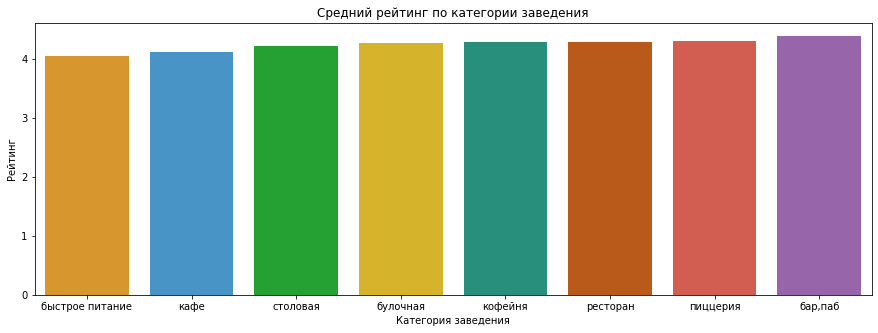

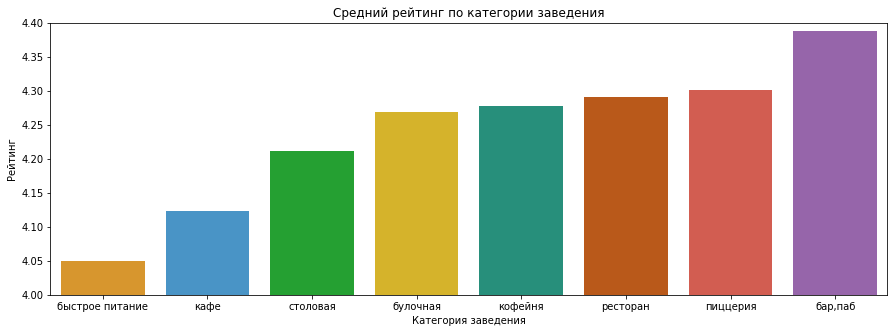

In [ ]:
sns.barplot(x='category', y='average', data=ratings_df, palette=category_colors)
plt.title('Средний рейтинг по категории заведения')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
fig, ax = plt.subplots()
sns.barplot(x='category', y='average', data=ratings_df, palette=category_colors)
plt.title('Средний рейтинг по категории заведения')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
ax.set_ylim([4, 4.4])
plt.show()

Видим странную картину. Средний рейтинг по категориям как будто одинаковый. Нужно это проверить:

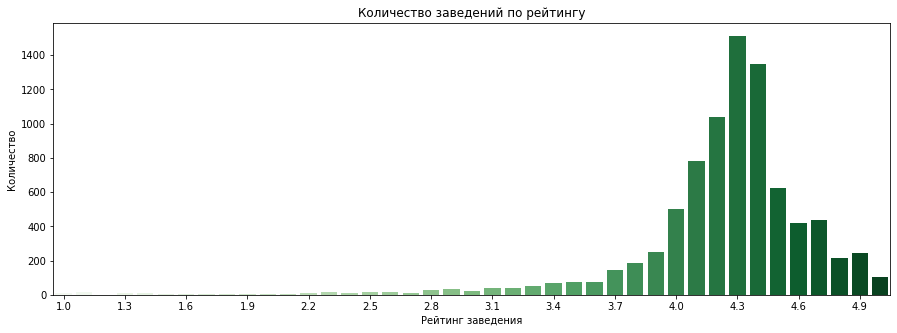

In [ ]:
sns.barplot(x=df.groupby('rating').chain.count().index, y=df.groupby('rating').chain.count().values, palette='Greens')
plt.title('Количество заведений по рейтингу')
plt.xlabel('Рейтинг заведения')
plt.ylabel('Количество')
plt.xticks(np.arange(0, 41, 3))
plt.show()

Действительно, подавляющее большинство оценок находится между 4 и 4.7. Выходит ситуация, когда у всех заведений рейтинг около 4, реальна, что мы и получили

### Визуализация средних рейтингов

Попробуем визуализировать ситуацию с рейтингами в виде карты Москвы. Для этого будем использовать библиотеку follium, а именно хороплет, и заранее подготовленный json файл с административными округами. Конкретно для вывода рейтинга воспользуемся небольшой хитростью - библиотекой geojson. Привяжем к properties каждого региона информацию о среднем рейтинге и выведем в виде подсказки.

In [ ]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

with open(state_geo, 'r', encoding='utf-8') as f:
    geo_data = json.load(f)

# Объединяем данные из DataFrame и geojson
for feature in geo_data['features']:
    district_name = feature['properties']['name']
    # Найдем средний рейтинг для данного района
    rating = df[df['district'] == district_name]['rating'].mean()
    # Добавляем средний рейтинг в свойства geojson
    feature['properties']['rating'] = rating if pd.notna(rating) else 'Нет данных'

# Создаем хороплет с помощью Choropleth и добавляем его на карту
choropleth = Choropleth(
    geo_data=geo_data,
    data=df.groupby('district', as_index=False).agg(rating = ('rating', 'mean')),
    columns=['district', 'rating'],
    key_on='feature.properties.name',  # Привязываем ключ к правильному свойству в geojson
    fill_color='Greens',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Средний рейтинг заведений по округам',
    highlight=True  # Включаем выделение при наведении
).add_to(m)

# Добавляем всплывающие подсказки (hover) с информацией о районе и среднем рейтинге
geojson = GeoJson(
    geo_data,
    style_function=lambda feature: {
        'fillColor': '#ffffff',
        'color': 'black',
        'fillOpacity': 0,
        'weight': 0.1
    },
    tooltip=GeoJsonTooltip(
        fields=['name', 'rating'],  # Отображаем название района и рейтинг
        aliases=['Район:', 'Средний рейтинг:'],  # Подписи к полям
        localize=True
    )
).add_to(m)

# выводим карту
m

Из графика можно увидеть, что в центрально регионе самые высокие рейтинги, что, в целом, не удивительно. Хотя, данные, конечно, не сильно разнятся. Разница между регионом с самым низким средним рейтингом всего около 0.25

### Расположение всех заведений на карте

Посмотрим, как заведения распределены географически. Это может стат решающим фактором при решении об открытии бизнеса. Используем всю ту же библиотеку follium, но в этот раз построим кластеры из географического расположения заведений

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Можно отметить достаточно плотное наполнение в центральном, северном и западном регионах. Восточный находится в центре по заполненности, а вот южный совсем не имеет зданий, по сравнению с другими сторонами света

### Топ-15 популярных улиц

Если ранее мы искали самые популярные заведения, то теперь рассмотрим улицы. Какие из них пользуются наибольшим спросом?

In [ ]:
top_15_streets = df.groupby('street').size().sort_values(ascending=False).head(15)

In [ ]:
count_by_category_street = df[df['street'].isin(top_15_streets.index)].\
                        groupby(['street', 'category']).size().reset_index(name='building_count')

# Сортируем районы по общему количеству заведений
total_counts = count_by_category_street.groupby('street')['building_count'].sum().reset_index()

# Сортируем по убыванию общего количества заведений
sorted_streets = total_counts.sort_values(by='building_count')['street']

# Применяем сортировку к исходным данным и сохраняем порядок
count_by_category_street = count_by_category_street.set_index('street')
count_by_category_street = count_by_category_street.loc[sorted_streets].reset_index()

# Получаем уникальные районы и категории для фильтрации
streets = count_by_category_street['street'].unique()
categories = count_by_category_street['category'].unique()

# Создаем пустую фигуру
fig = go.Figure()

for category in categories:
    filtered_data = count_by_category_street[count_by_category_street['category'] == category]

    # Сгруппируем данные по районам
    streets_in_category = filtered_data['street']
    counts_in_category = filtered_data['building_count']

    fig.add_trace(go.Bar(
        x=counts_in_category,  # Количество заведений по каждой категории
        y=streets_in_category,  # Районы
        name=category,  # Имя категории
        orientation='h',  # Горизонтальный бар-чарт
        marker_color=category_colors[category],  # Используем цвет категории
        visible=True,  # По умолчанию видимый
        text=filtered_data['building_count'],  # Отображаем проценты
        textposition='inside'
    ))

# Создаем список кнопок для фильтрации по категориям
dropdown_buttons = [
    dict(label="Все категории", method="update",
         args=[{"visible": [True] * len(streets) * len(categories)},  # Показываем все категории
               {"title": "Анализ количества заведений по улицам"}])
]

# Добавляем кнопку для каждой категории
for i, category in enumerate(categories):
    button = dict(label=category, method="update",
                  args=[{"visible": [(i == j) for j in range(len(categories))]},  # Показываем только выбранные категории
                        {"title": f"Количество заведений категории {category} на улицах"}])
    dropdown_buttons.append(button)

# Настройка макета с легендой и фильтрацией
fig.update_layout(
    updatemenus=[dict(buttons=dropdown_buttons,
                      direction="down",
                      showactive=True,
                      x=0.17,
                      y=1.12,
                      xanchor='left',
                      yanchor='top',
                      pad={"r": 10, "t": 10},
                      font=dict(size=15))],
    xaxis_title='Количество заведений',
    yaxis_title='Наименование административного округа',
    title="Анализ количества заведений по улицами",
    legend=dict(
        x=1,  # Легенда справа
        y=1,  # Легенда вверху
        traceorder="normal",
        font=dict(size=10),
        bgcolor="rgba(255, 255, 255, 0.5)",
        bordercolor="Black",
        borderwidth=1
    ),
    barmode='stack',  # Используем стековые бары
    width=1000,
    height=600
)

# Отображаем график
fig.show()


Лидером по многим категориям заведений является проспект Мира - большая, длинная улица, которая идет практически из центра города. Там почти на каждом шагу можно встретить либо кофейню, либо кафе.

Затем уже сложнее сказать, какая из улиц пользуется большим спросом. Где-то много кафе, но почти нет ресторанов, где-то много ресторанов но нет кофеен. Необходимо каждую улицу изучать в соответствии с желаниями заказчика

In [ ]:
top_15_streets

street
проспект Мира             183
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
dtype: int64

Но если нужны "сырые" цифры из количества зданий, то в топ-3 входят: проспект Мира, улица Профсоюзная, проспект Вернадского

### Анализ одиноких улиц

Ранее мы смотрели самые популярные улицы, теперь наоборот, взглянем, как обстоят дела с улицами, где находится лишь 1 заведение

In [ ]:
lonely_streets = df.groupby('street', as_index=False).size().sort_values('size').query('size == 1')

In [ ]:
building_on_lonely_streets = df[df['street'].isin(lonely_streets['street'])]

Построим на карте:

In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

building_on_lonely_streets.apply(create_clusters, axis=1)

m

Как видим, их все еще больше в центральном, северном и западном регионах.

In [ ]:
building_on_lonely_streets.rating.mean()

4.236681222707423

Средний рейтинг почти никак не отличается от заведений на других улицах

In [ ]:
building_on_lonely_streets.groupby('category').size().sort_values(ascending=False)

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
dtype: int64

Большинство заведений являются такими же, как и на других улицах - кафе, ресторан, кофейня. Здесь также разницы нет

По итогу сложно сказать, в чем данные заведения отличаются от тех, которые делят одну улицу с конкурентами. Основные показатели остаются такими же

### Визуализация средних цеков

Еще один столбец, от которого мы не смогли получить много информации - о среднем чеке. Опираться на полученные выводы будет необходимо с осторожностью.

In [ ]:
district_paycheck = df.groupby('district', as_index=False).middle_avg_bill.median()

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Объединяем данные из DataFrame и geojson
for feature in geo_data['features']:
    district_name = feature['properties']['name']
    # Найдем медианный средний чек для данного района
    average = df[df['district'] == district_name]['middle_avg_bill'].median()
    # Добавляем средний рейтинг в свойства geojson
    feature['properties']['average'] = average if pd.notna(average) else 'Нет данных'

# Создаем хороплет с помощью Choropleth и добавляем его на карту
choropleth = Choropleth(
    geo_data=geo_data,
    data=district_paycheck,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.properties.name',  # Привязываем ключ к правильному свойству в geojson
    fill_color='Greens',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Медианный средний чек заведений по округам',
    highlight=True  # Включаем выделение при наведении
).add_to(m)

# Добавляем всплывающие подсказки (hover) с информацией о районе и среднем рейтинге
geojson = GeoJson(
    geo_data,
    style_function=lambda feature: {
        'fillColor': '#ffffff',
        'color': 'black',
        'fillOpacity': 0,
        'weight': 0.1
    },
    tooltip=GeoJsonTooltip(
        fields=['name', 'average'],  # Отображаем название района и рейтинг
        aliases=['Район:', 'Медианный средний чек:'],  # Подписи к полям
        localize=True
    )
).add_to(m)

# выводим карту
m

Как и предполагалось, средний чек в центре и в западном округе на порядок выше, чем в других регионах(отличие от Юго-Восточного практически в 2 раза)

График чем-то напоминает график средних рейтингов и заполненности заведениями по регионам. Чем выше конкуренция - тем больше чек.

### Вывод по разделу 3

Проанализировали предоставленную в датафрейме информацию. Полученные выводы:

- Самыми популярными заведениями являются: кафе, кофейни и рестораны. Их количество на порядок больше, чем у других категорий
- Сетевых заведений не так много(~40%). Большинство все же предпочитают работать в одиночку
- Если взять топ-15 самых популярных заведений по брэнду, то 80% из них либо кафе, либо рестораны, либо кофейни(Конкуренция очень высока)
- Географически самым напряженным регионом является центральный - в нем наиболее высокая конкуренция. Наименее напряженный регон - южный, а также немного юго-восточный. Там не так много заведений, низкий средний чек и больше мест для застройки. Но даже в популярных регионах находятся улицы, на которых есть лишь одно заведение.
- Выделили 10 улиц с большой конкуренцией. В топ-3 входят: проспект Мира, улица Профсоюзная, проспект Вернадского

## Детализация иследования - открытие кофейни

Поступил ззапрос от заказчика на анализ датафрейма с целью основания кофейни. Сразу стоит выделить, что конкуренция в любом случае будет немаленькой, так как данная категория входит в топ-3 по популярности, но все же. Взглянем на данные:

### Анализ количества и расположения

In [ ]:
coffee_df = df[df['category'] == 'кофейня'].drop_duplicates()

In [ ]:
coffee_df.count()

name                 1413
category             1413
address              1413
district             1413
hours                1398
lat                  1413
lng                  1413
rating               1413
price                 476
avg_bill              721
middle_avg_bill       199
middle_coffee_cup     520
chain                1413
seats                 710
street               1413
is_24_7              1413
dtype: int64

Всего мы имеем 1413 кофеен во всем датасете. Немало, учитывая, что всего у нас 8500 позиций

In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

coffee_df.apply(create_clusters, axis=1)

m

На карте они распределены в центре, слева и сверху, со странным пробелом между всеми тремя сторонами. малое количество находится справа, снизу и снизу-справа. В центре находится рекордное количество заведений

Есть тенденция, что кофейни находятся, в большинстве своем, рядом с метро, либо с объектами интереса(достопримечательностями, например)

In [ ]:
coffee_df[coffee_df['is_24_7'] == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,wild bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,Дмитровское шоссе,True
971,wild bean cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,Ярославское шоссе,True
1047,wild bean cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,Ярославское шоссе,True
1214,wild bean cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,МКАД,True
1291,шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица Народного Ополчения,True
1468,кофе хауз,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,Ленинградский проспект,True
1790,кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,Ленинградский проспект,True
1825,you&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица Золоторожский Вал,True
1883,кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,Лесная улица,True
2030,cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,Долгоруковская улица,True


Существует некоторое количество круглосуточных кофеен, но если взять долю, то отношение будет малым. Все же кофе людей не интересует круглосуточно, а, обычно, лишь утром

### Анализ сети

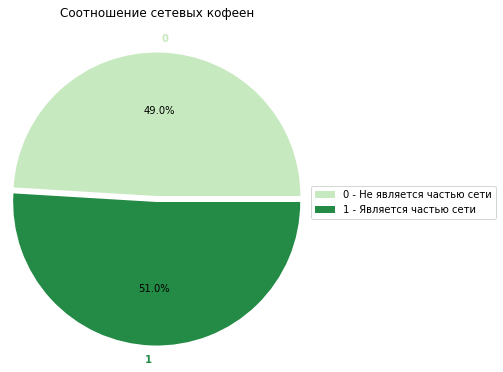

In [ ]:
fig, ax = plt.subplots()
patches, texts, pcts = ax.pie('size',
                              labels='chain',
                              data=coffee_df.groupby('chain', as_index=False).name.size(),
                              autopct='%1.1f%%',
                              explode = (0.05, 0),
                              radius = 1.2,
                              colors=['#c7e9c0', '#238b45'])
ax.legend(['0 - Не является частью сети', '1 - Является частью сети'], loc='center left', bbox_to_anchor=(1, 0.5))
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())
fig.set_size_inches(10.5, 5.5)
plt.setp(texts, fontweight=600)
plt.title('Соотношение сетевых кофеен', y=1.1)
plt.show()

Практически 50/50 шанс того, что кофейни входят в состав франшизы

In [ ]:
for chain in coffee_df['chain'].unique():
    cup_price = coffee_df[coffee_df["chain"] == chain].middle_coffee_cup.mean().round(2)
    display(f'В {"сетевой" if chain == 1 else "несетевой"} кофейне средняя чашка кофе = {cup_price} р.')

'В несетевой кофейне средняя чашка кофе = 177.3 р.'

'В сетевой кофейне средняя чашка кофе = 167.34 р.'

Стоимость также не отличается от того, входит ли кофейн в состав франшизы или нет

### Анализ рейтингов кофеен

Отобразим рейтинги графически, как раньше

In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Объединяем данные из DataFrame и geojson
for feature in geo_data['features']:
    district_name = feature['properties']['name']
    # Найдем средний рейтинг для данного района
    rating = df[df['district'] == district_name]['rating'].mean()
    # Добавляем средний рейтинг в свойства geojson
    feature['properties']['rating'] = rating if pd.notna(rating) else 'Нет данных'

# Создаем хороплет с помощью Choropleth и добавляем его на карту
choropleth = Choropleth(
    geo_data=geo_data,
    data=coffee_df.groupby('district', as_index=False).agg(rating = ('rating', 'mean')),
    columns=['district', 'rating'],
    key_on='feature.properties.name',
    fill_color = 'Greens',# Привязываем ключ к правильному свойству в geojson
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Средний рейтинг кофеен по округам',
    highlight=True # Включаем выделение при наведении
).add_to(m)

# Добавляем всплывающие подсказки (hover) с информацией о районе и среднем рейтинге
geojson = GeoJson(
    geo_data,
    style_function=lambda feature: {
        'fillColor': '#ffffff',
        'color': 'black',
        'fillOpacity': 0,
        'weight': 0.1
    },
    tooltip=GeoJsonTooltip(
        fields=['name', 'rating'],  # Отображаем название района и рейтинг
        aliases=['Район:', 'Средний рейтинг:'],  # Подписи к полям
        localize=True
    )
).add_to(m)

# выводим карту
m

Ситуация не сильно отличается от общей тенденци. Рейтинги в центре самые высокие, а на юге и востоке низкие

### Анализ средней стоимости чашки кофе

Посмотрим, на какую стоимость стоит ориентироваться, если основывать кофейню:

In [ ]:
coffee_cup = coffee_df.groupby('middle_coffee_cup', as_index=False).size()

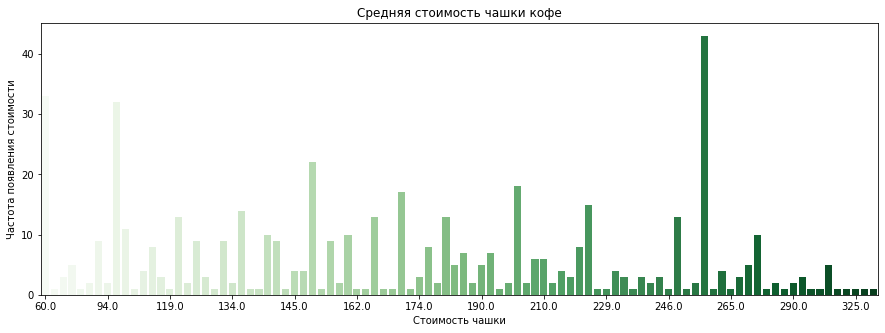

In [ ]:
sns.barplot(x=coffee_cup['middle_coffee_cup'], y=coffee_cup['size'], palette='Greens')
plt.title('Средняя стоимость чашки кофе')
plt.xlabel('Стоимость чашки')
plt.ylabel('Частота появления стоимости')
plt.xticks(np.arange(0, len(coffee_cup), 7))
plt.show()

Так как слишком много разных значений у нас в таблице, попробуем вывести только те ценники, количество которых больше 10

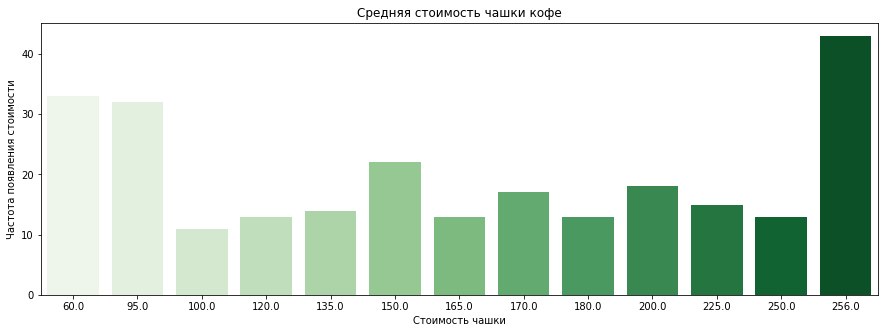

In [ ]:
sns.barplot(x=coffee_cup[coffee_cup['size'] > 10]['middle_coffee_cup'], y=coffee_cup[coffee_cup['size'] > 10]['size'], palette='Greens')
plt.title('Средняя стоимость чашки кофе')
plt.xlabel('Стоимость чашки')
plt.ylabel('Частота появления стоимости')
plt.show()

Ситуация странная. Большое количество кофеен со стоимостью в 60, хотя там написано "От 60", а также болшое количество на отметках в 95 и 256. Можно обратиться к самым популярным кофейням и посмотреть, как у них обстоят дела:

In [ ]:
top_10_coffee = df[df['category'] == 'кофейня'].groupby('name').size().sort_values(ascending=False).head(10)

In [ ]:
df[df['name'].isin(top_10_coffee.index)].middle_coffee_cup.median()

120.0

Медианное значение находится на цифре в 120. Также построим график скрипки, чтобы увидеть широту разброса не только вдоль:

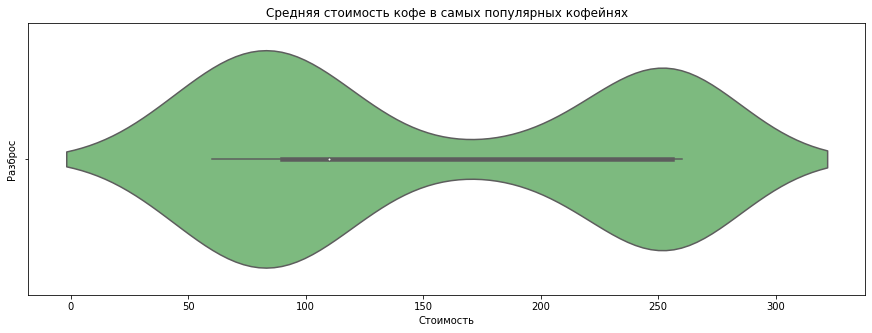

In [ ]:
sns.violinplot(x=df[(df['name'].isin(top_10_coffee.index)) & \
                    (df['middle_coffee_cup'] < df[df['name'].isin(top_10_coffee.index)].middle_coffee_cup.quantile(0.95))].\
                   middle_coffee_cup, palette='Greens')
plt.title('Средняя стоимость кофе в самых популярных кофейнях')
plt.xlabel('Стоимость')
plt.ylabel('Разброс')
plt.show()

Взяли 95-ый процентиль как верхний потолок из-за того, что есть несколько выбросных значений в датасете. Можем наблюдать интересную историю: одновременно много кофеен со средней стоимостью в ~75, а также много со стоимостью ~250.

Это может говорить о разном классе кофеин - есть такие заведения, которые предназначены на "быстроту" кофе. Оно там обычно несложное и стоит дешево. Но есть заведения, которые очень ценят качество приготовленног напитка. Там кофе обойдется недешево, зато будет высшего качества. В зависимости от типа кофейни у нас есть примерные цифры для стоимости.

### Анализ графика работы

In [ ]:
coffee_df.groupby('hours').size().sort_values(ascending=False).head(10)

hours
ежедневно, 10:00–22:00                  140
ежедневно, 08:00–22:00                   60
ежедневно, круглосуточно                 59
ежедневно, 09:00–22:00                   57
пн-пт 08:00–19:00                        46
пн-пт 08:00–21:00; сб,вс 09:00–21:00     46
ежедневно, 09:00–21:00                   43
пн-пт 08:00–22:00; сб,вс 09:00–22:00     42
ежедневно, 08:00–21:00                   36
пн-пт 08:00–18:30                        34
dtype: int64

Видим, что самые предпочтительные графики для работы это либо ежедневные, либо будние, обязательно с утра(Желательно с 8)

### Подготовка почвы к основанию

Посмотрим, какие улицы можно рекомендовать для основания кофейни. Ключевыми показателями будут - средняя цена чашки и рейтинг заведения

In [ ]:
streets_for_coffee = coffee_df.groupby('street', as_index=False).\
                            agg(cup_price=('middle_coffee_cup', 'mean'), rating=('rating', 'mean'))

In [ ]:
best_streets_for_coffee = streets_for_coffee.sort_values(['cup_price', 'rating'], ascending=False).head(10)
best_streets_for_coffee

,street,cup_price,rating
88,Большая Никитская улица,328.0,4.40
40,3-я Фрунзенская улица,320.0,4.30
83,Богословский переулок,300.0,4.60
96,Большая Сухаревская площадь,300.0,4.40
465,площадь Победы,291.0,4.30
32,3-й Крутицкий переулок,291.0,4.15
519,улица Гарибальди,291.0,4.10
244,Милютинский переулок,290.0,4.50
156,Енисейская улица,287.0,4.25
384,Стремянный переулок,285.0,4.45


Получили список из 10 улиц, где соотношение цена за чашку/рейтинг заведений наибольшее

### Вывод по разделу 4

Рассмотрели датасет с целью получения информации об основании кофейни. Приведем основные выводы:

- Существует два подхода:
    - Основать кофейню в центральном/западном округе с высокой конкуренцией, высоким риском выйти в минус, но также и высоким доходом
    - Основать кофейню в юго-восточном регионе, где наименьшая конкуренция, но есть и минусы у такого подхода, а именно низкая доходность. Чем больше конкуренция - больше прибыль
- Статистически лучшими улицами для основания заведения являются: Большая Никитская, 3-я Фрунзенская и Богословский пер.
- График - желательно, чтобы кофейня открывалась с 8 и работала либо ежедневно, либо по будням
- Стоимость - в зависимости от направления кофейни и качества кофе, оптимальные, конкурентноспособные ценники находятся на позициях в 75 р. и 250 р. за чашку
- Франшиза или собственный бизнес - к сожалению, на этот вопрос не получится однозначно ответить по данной выборке. В конечном счете это всегда лишь решение заказчика. Все кофейни делятся примерно 50/50 на франшизные и нет, средний чек при этом почти одинаковый у обоих групп.

## Общий вывод

### Вывод:

- __1. Подготовка датафреймов -__ Импортировали нужные библиотеки, создали DataFrame из csv файла.
- __2. Предобработка данных -__ Данные оказались очень хорошими и практически не нуждались в предобработке, но все же вот шаги, которые провели:

  - Проверили датафреймы на явные и неявные дубликаты. Их не оказалось
  - Рассмотрели пропуски. По итогу их нигде не оказалось.
  - Добавили новые столбцы и заполнили их данными
  - Рассмотрели и избавились от аномальных данных(выбросов), которые могли повлиять на результаты расчетов
- __3. Анализ данных -__ Проанализировали предоставленную в датафрейме информацию:

  - Самыми популярными заведениями являются: кафе, кофейни и рестораны. Их количество на порядок больше, чем у других категорий
  - Сетевых заведений не так много(~40%). Большинство все же предпочитают работать в одиночку
  - Если взять топ-15 самых популярных заведений по брэнду, то 80% из них либо кафе, либо рестораны, либо кофейни(Конкуренция очень высока)
  - Географически самым напряженным регионом является центральный - в нем наиболее высокая конкуренция. Наименее напряженный регон - южный, а также немного юго-восточный. Там не так много заведений, низкий средний чек и больше мест для застройки. Но даже в популярных регионах находятся улицы, на которых есть лишь одно заведение.
  - Выделили 10 улиц с большой конкуренцией. В топ-3 входят: проспект Мира, улица Профсоюзная, проспект Вернадского
- __4. Изучение возможности открытия кофейни -__ Анализ датасета по просьбе заказчика с конечной целью - дать ответ на вопрос: на что обращать внимание при открытии кофейни? Основные наблюдения:

  - Расположение - Существует два подхода:
    - Основать кофейню в центральном/западном округе с высокой конкуренцией, высоким риском выйти в минус, но также и высоким доходом
    - Основать кофейню в юго-восточном регионе, где наименьшая конкуренция, но есть и минусы у такого подхода, а именно низкая доходность. Чем больше конкуренция - больше прибыль
  - Статистически лучшими улицами для основания заведения являются: Большая Никитская, 3-я Фрунзенская и Богословский пер.
  - График - желательно, чтобы кофейня открывалась с 8 и работала либо ежедневно, либо по будням
  - Стоимость - в зависимости от направления кофейни и качества кофе, оптимальные, конкурентноспособные ценники находятся на позициях в 75 р. и 250 р. за чашку
  - Франшиза или собственный бизнес - к сожалению, на этот вопрос не получится однозначно ответить по данной выборке. В конечном счете это всегда лишь решение заказчика. Все кофейни делятся примерно 50/50 на франшизные и нет, средний чек при этом почти одинаковый у обоих групп.
- __5. Общее заключение -__ Провели анализ датасета и получили самую важную информацию по открытию бизнеса в сети питания, насколько это позволял текущий набор данных. Составили рекомендации для заказчика(Оформленные выводы с иллюстрациями в виде презентации можно найти по [ссылке](https://docs.google.com/presentation/d/1VkVmIwPwc7GRxEzurkFgenV_xTmFq1aNWUOfGksfwLc/edit?usp=sharing))